In [36]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import glob

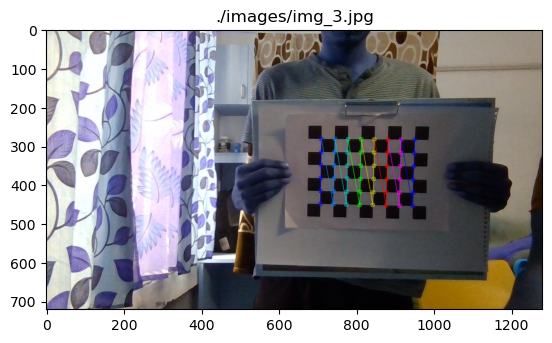

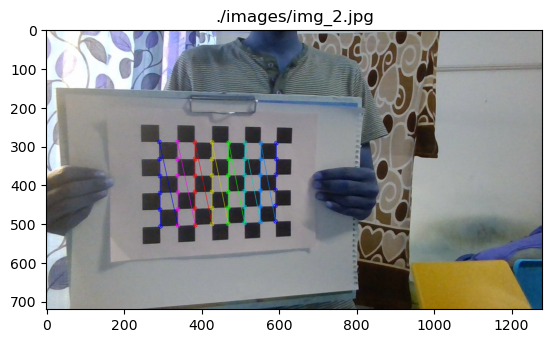

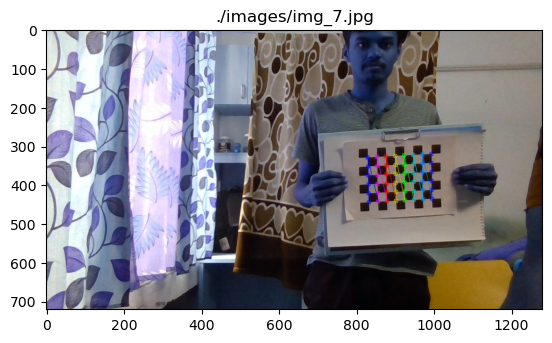

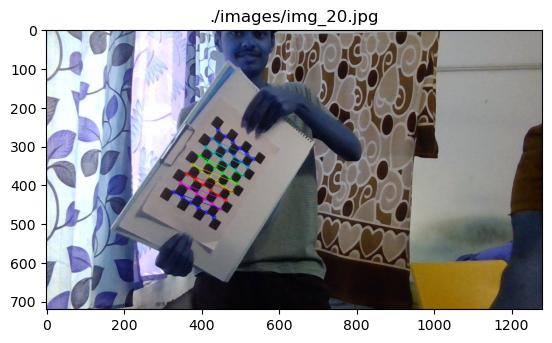

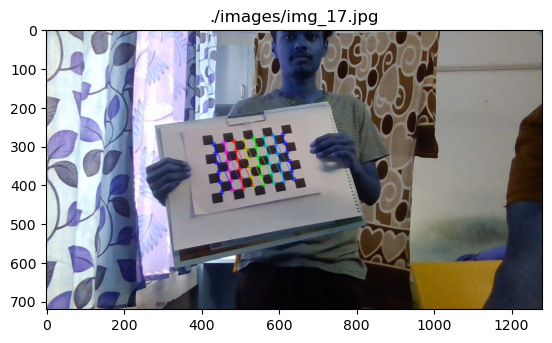

...

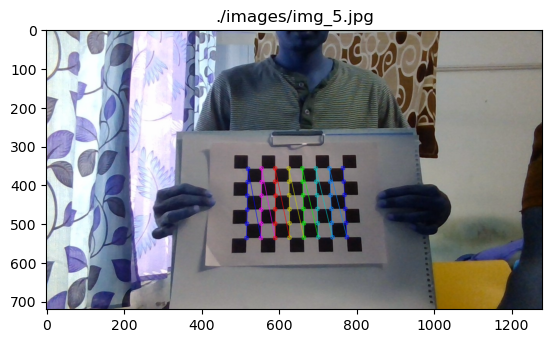

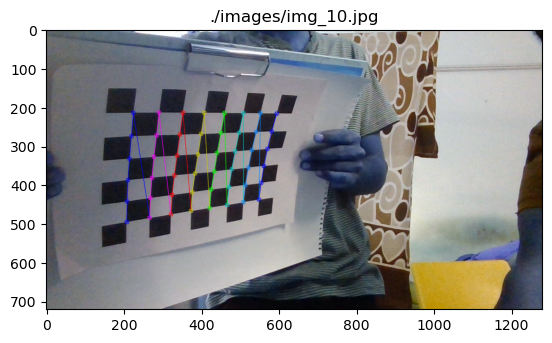

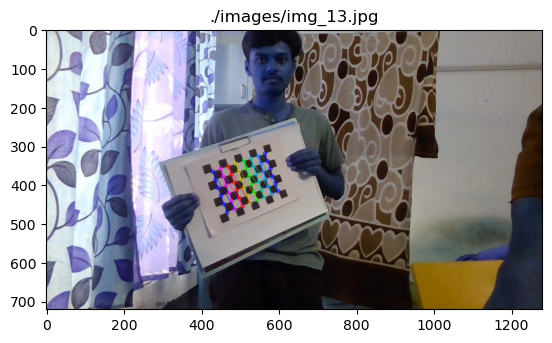

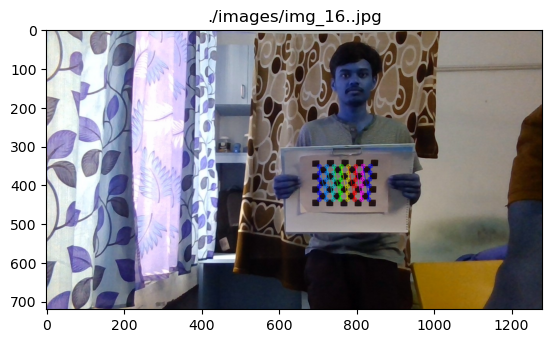

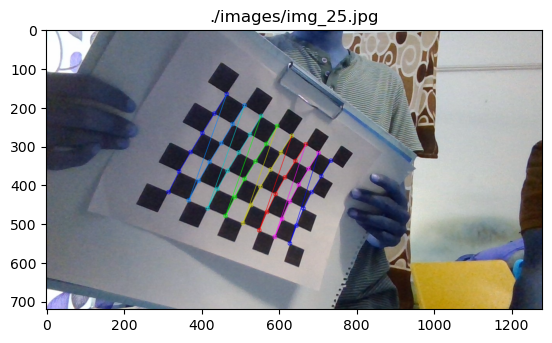

Camera matrix : 

[[979.30357758   0.         651.58307764]
 [  0.         976.11635163 346.5744216 ]
 [  0.           0.           1.        ]]
dist : 

[[ 0.05422682  0.05358565  0.01268237  0.00671855 -0.72576012]]
rvecs : 

(array([[ 0.07488549],
       [ 0.05762311],
       [-1.55777445]]), array([[-0.12811195],
       [-0.23896651],
       [ 1.56820094]]), array([[ 0.05919812],
       [-0.16304197],
       [ 1.51271799]]), array([[-0.0273147 ],
       [-0.66878924],
       [ 0.62119869]]), array([[-0.44903503],
       [ 0.12605213],
       [ 1.34399935]]), array([[ 0.26847403],
       [-0.37476532],
       [ 1.52110708]]), array([[-0.10124543],
       [-0.26048357],
       [-1.04047732]]), array([[ 0.13460564],
       [-0.20450102],
       [ 0.90278051]]), array([[-0.08403722],
       [ 0.72405547],
       [-1.47536946]]), array([[-0.2308594 ],
       [ 0.32367464],
       [ 1.50533523]]), array([[-0.04137329],
       [-0.0176773 ],
       [ 1.11935572]]), array([[ 0.05998273],
 

In [37]:
rows = 6
cols = 8
CHECKERBOARD = (rows,cols)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objpoints = []
imgpoints = [] 
images = []
 
 
# # Defining the world coordinates for 3D points
objp = np.zeros((1, CHECKERBOARD[0] * CHECKERBOARD[1], 3), np.float32)
objp[0,:,:2] = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1, 2)
prev_img_shape = None
 
# Extracting path of individual image stored in a given directory
images = glob.glob('./images')
for fname in os.listdir("./images"):
    fname="./images/"+fname
    img = cv2.imread(fname)
    # images.append(img)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_FAST_CHECK + cv2.CALIB_CB_NORMALIZE_IMAGE)
    if ret == True:
        objpoints.append(objp)
        corners2 = cv2.cornerSubPix(gray, corners, (11,11),(-1,-1), criteria)
        imgpoints.append(corners2)
        img = cv2.drawChessboardCorners(img, CHECKERBOARD, corners2, ret)
    plt.imshow(img)
    plt.title(f"{fname}")
    plt.show() 
h,w = img.shape[:2]
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

print("Camera matrix : \n")
print(mtx)
print("dist : \n")
print(dist)
print("rvecs : \n")
print(rvecs)
print("tvecs : \n")
print(tvecs)

In [38]:
print("Intrinsic Parameters:     ")
print("Focal Length (fx, fy):", mtx[0, 0], mtx[1, 1])
print("Skew Parameter (s):", mtx[0, 1])
print("Principal Point (cx, cy):", mtx[0, 2], mtx[1, 2])
print("Distortion Coefficients:", dist)
print("RMS reprojection error",ret)

Intrinsic Parameters:     
Focal Length (fx, fy): 979.3035775751691 976.1163516302731
Skew Parameter (s): 0.0
Principal Point (cx, cy): 651.5830776443647 346.5744216000168
Distortion Coefficients: [[ 0.05422682  0.05358565  0.01268237  0.00671855 -0.72576012]]
RMS reprojection error 1.9322428621780228


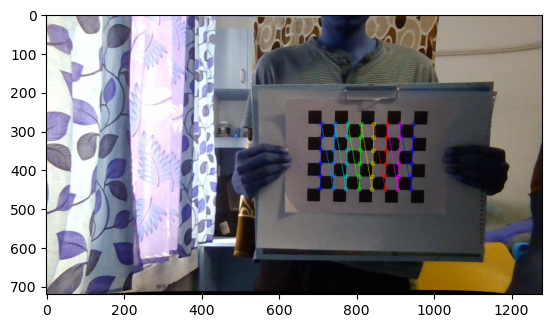

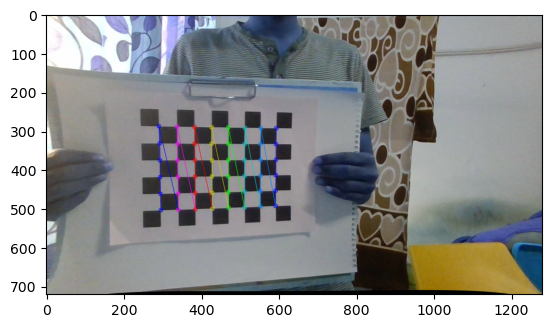

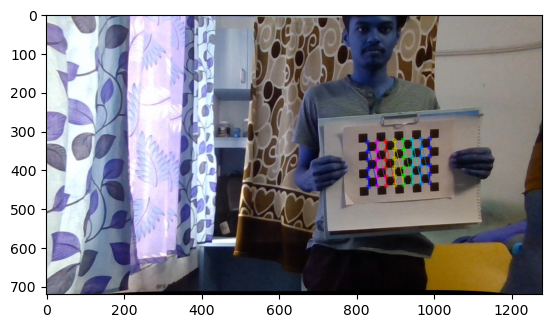

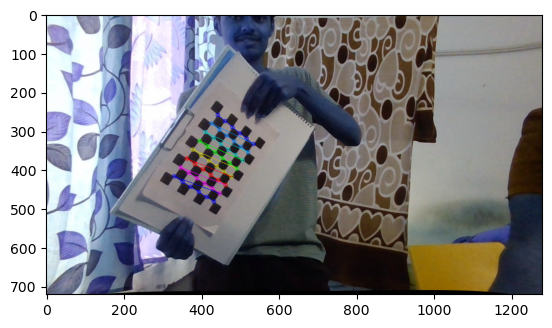

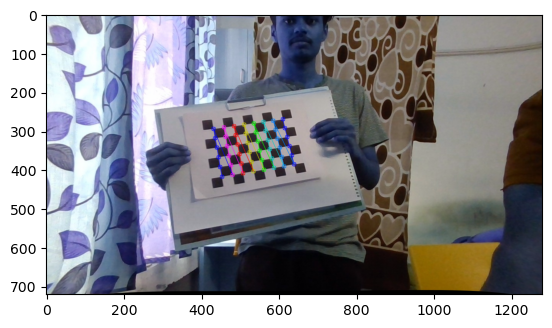

In [46]:
i=0
for fname in os.listdir("./images"):
    fname="./images/"+fname
    img1 = cv2.imread(fname)
    img=cv2.undistort(img1, mtx, dist)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_FAST_CHECK + cv2.CALIB_CB_NORMALIZE_IMAGE)
    if ret == True:
        corners2 = cv2.cornerSubPix(gray, corners, (11,11),(-1,-1), criteria)
        img = cv2.drawChessboardCorners(img, CHECKERBOARD, corners2, ret)
    plt.imshow(img)
    plt.show() 
    i+=1
    if i==5:
        break



Here, The distrotion effect is less, so that there isn't much change in both images. After the distortion correction, some of the lines appear straight compared to the previous

Reprojections error calculated between image points calculated at first using camera caliberation and object points projected to image plane points using intrinsic and extrinsic parameters calculated.A lower reprojection error indicates a more accurate calibration and reconstruction. It is used to evaluate the accuracy of camera calibration and 3D reconstruction processes

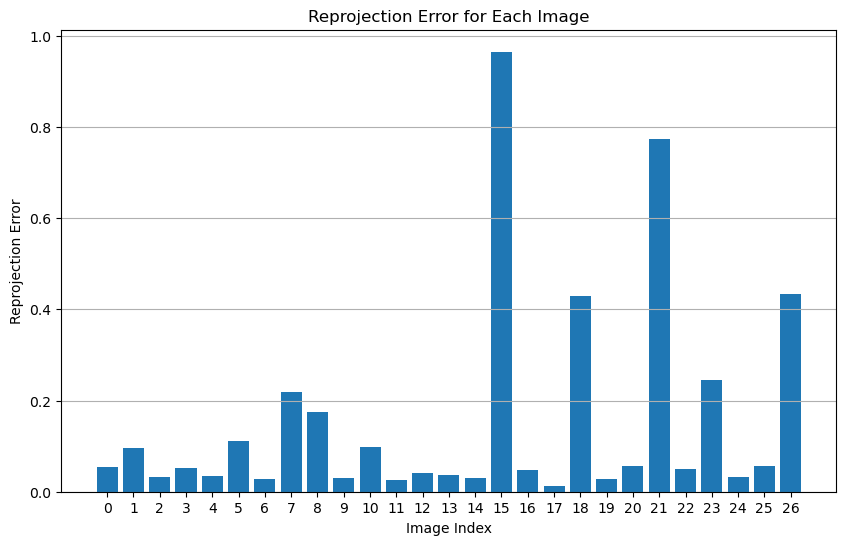

Mean Reprojection Error: 0.1554749702347188
Standard Deviation of Reprojection Error: 0.231538460500187


In [40]:
# Compute reprojection error for each image
reproj_errors = []
images = glob.glob('./images')
for idx,fname in enumerate(os.listdir("./images")):
    fname="./images/"+fname
    img = cv2.imread(fname)
    images.append(img)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    corners, _ = cv2.findChessboardCorners(gray, CHECKERBOARD)
    if corners is not None:
        img_points_reproj, _ = cv2.projectPoints(objpoints[idx], rvecs[idx], tvecs[idx], mtx, dist)
        error = cv2.norm(imgpoints[idx], img_points_reproj, cv2.NORM_L2) / len(img_points_reproj)
        reproj_errors.append(error)

plt.figure(figsize=(10, 6))
plt.bar(range(len(reproj_errors)), reproj_errors)
plt.xlabel('Image Index')
plt.ylabel('Reprojection Error')
plt.title('Reprojection Error for Each Image')
plt.xticks(range(len(reproj_errors)))
plt.grid(axis='y')
plt.show()

# Compute mean and standard deviation of reprojection error
mean_error = np.mean(reproj_errors)
std_dev_error = np.std(reproj_errors)
print("Mean Reprojection Error:", mean_error)
print("Standard Deviation of Reprojection Error:", std_dev_error)


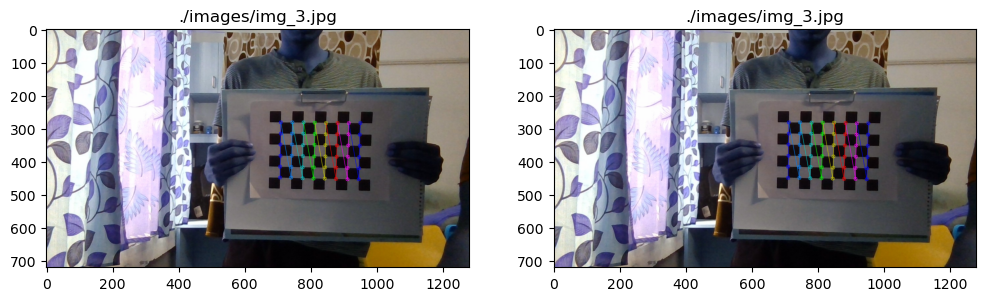

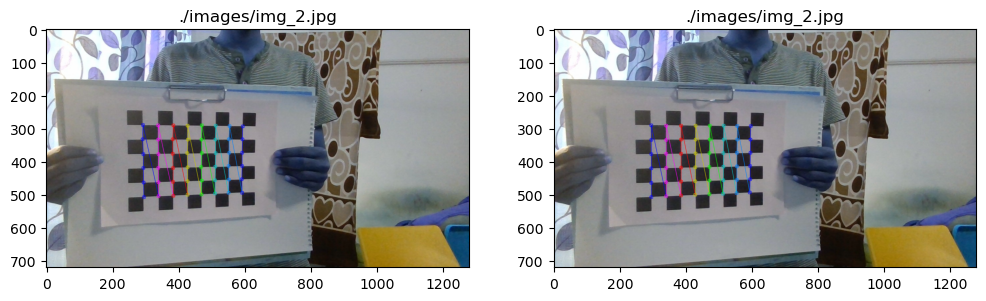

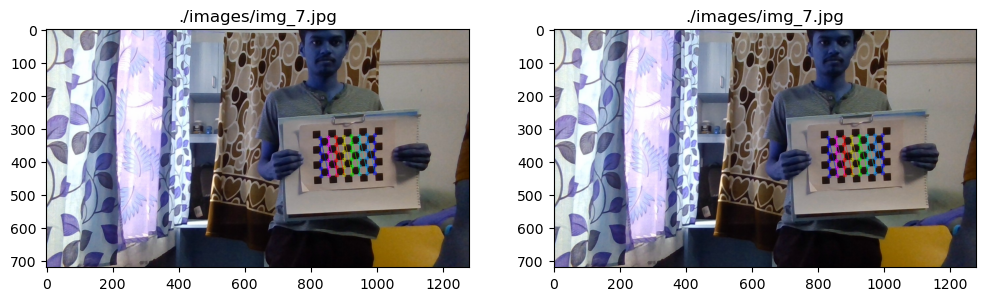

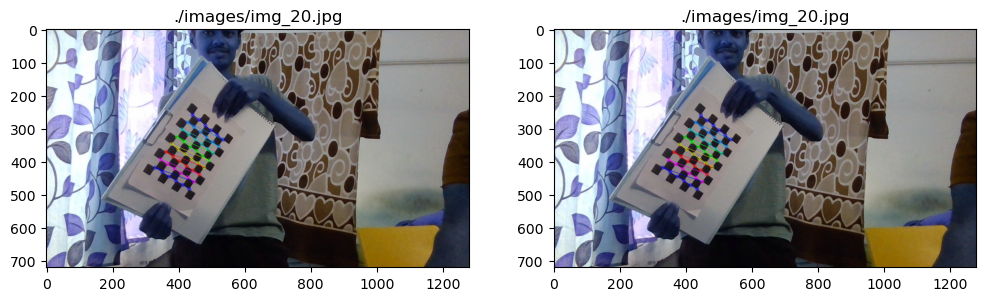

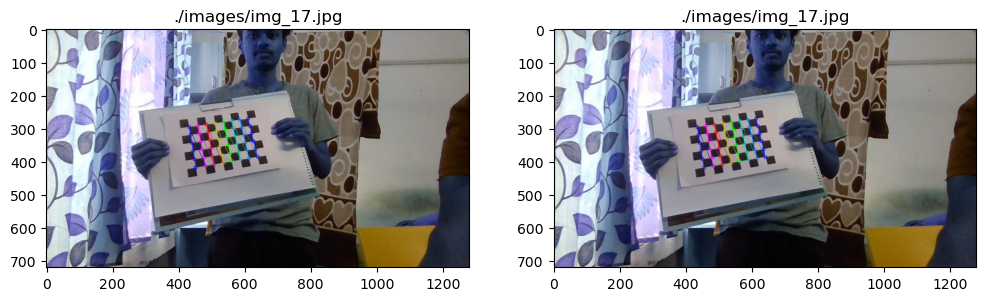

...

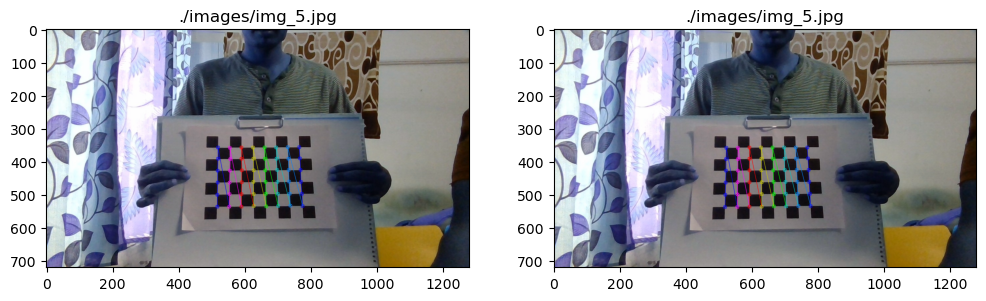

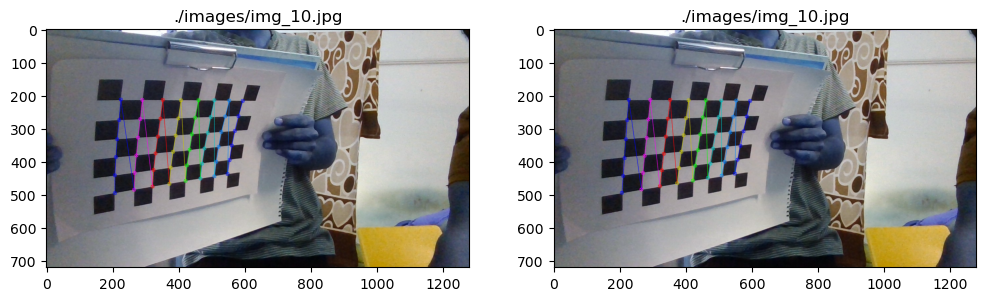

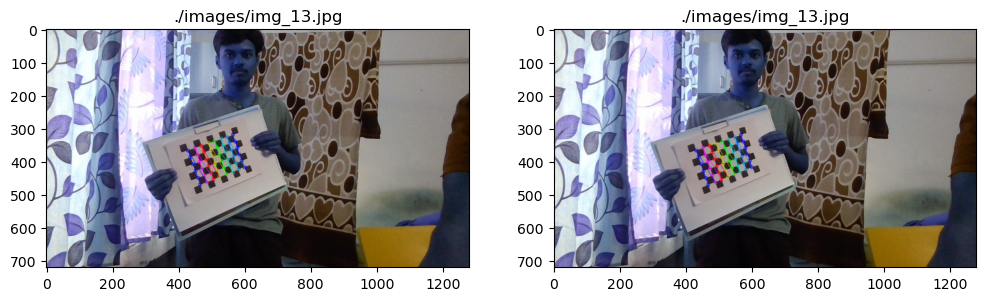

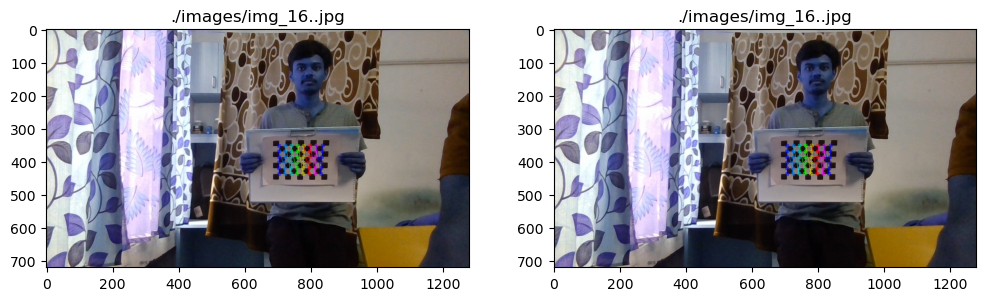

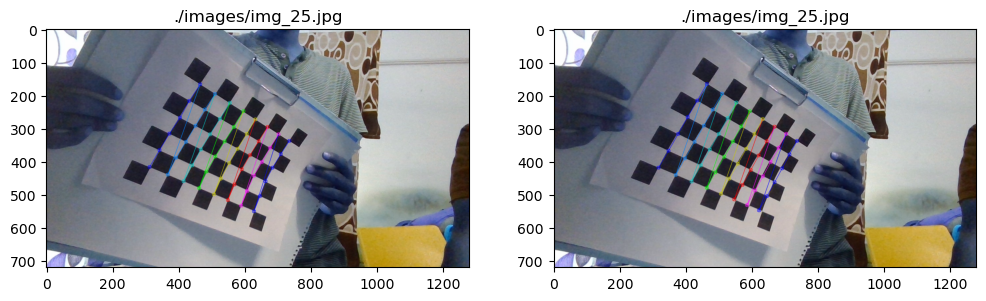

In [41]:
images = glob.glob('./images')
for idx,fname in enumerate(os.listdir("./images")):
    fname="./images/"+fname
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD)
    if ret:
        img_corners = cv2.drawChessboardCorners(img.copy(),CHECKERBOARD, corners, ret)
        img_points_reproj, _ = cv2.projectPoints(objpoints[idx], rvecs[idx], tvecs[idx], mtx, dist)
        img_corners2 = cv2.drawChessboardCorners(img.copy(),CHECKERBOARD, img_points_reproj, True)
        plt.figure(figsize=(12,6))
        plt.subplot(1,2,1)
        plt.imshow(img_corners)
        plt.title(f"{fname}")
        plt.subplot(1,2,2)
        plt.imshow(img_corners2)
        plt.title(f"{fname}")
        plt.show()


In [42]:
board_normals = []
for idx,fname in enumerate(os.listdir("./images")):
    fname="./images/"+fname
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD)
    if ret:
        corners_subpix = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001))
        bool1,rotvec, tranvec,inlier = cv2.solvePnPRansac(objp, corners_subpix, mtx,dist)
        Rot_mat, _ = cv2.Rodrigues(rotvec)
        normal_world = np.array([0, 0, 1])
        c_normal = np.dot(Rot_mat.T, normal_world)
        c_normal=c_normal/ np.linalg.norm(c_normal)
        board_normals.append(c_normal)


for idx, normal in enumerate(board_normals):
    print(f" Checkerboard Plane Normal {idx + 1} (Oc frame):", normal)

 Checkerboard Plane Normal 1 (Oc frame): [-0.08433021  0.01150078  0.99637149]
 Checkerboard Plane Normal 2 (Oc frame): [ 0.06916055 -0.23149987  0.97037345]
 Checkerboard Plane Normal 3 (Oc frame): [ 0.143721   -0.06242629  0.98764732]
 Checkerboard Plane Normal 4 (Oc frame): [ 0.57172636 -0.21735896  0.79112834]
 Checkerboard Plane Normal 5 (Oc frame): [-0.34180607 -0.24082971  0.9083885 ]
 Checkerboard Plane Normal 6 (Oc frame): [ 0.40040796 -0.06097226  0.91430621]
 Checkerboard Plane Normal 7 (Oc frame): [0.26070827 0.04013755 0.9645829 ]
 Checkerboard Plane Normal 8 (Oc frame): [0.23241409 0.0300453  0.97215275]
 Checkerboard Plane Normal 9 (Oc frame): [-0.38955463 -0.47488353  0.78913422]
 Checkerboard Plane Normal 10 (Oc frame): [-0.34924633  0.04995293  0.93569851]
 Checkerboard Plane Normal 11 (Oc frame): [-0.00662807 -0.04214781  0.9990894 ]
 Checkerboard Plane Normal 12 (Oc frame): [0.07438735 0.00548926 0.99721432]
 Checkerboard Plane Normal 13 (Oc frame): [ 0.00724313 -0.